# Object Detection


## Specificity of Object Detection

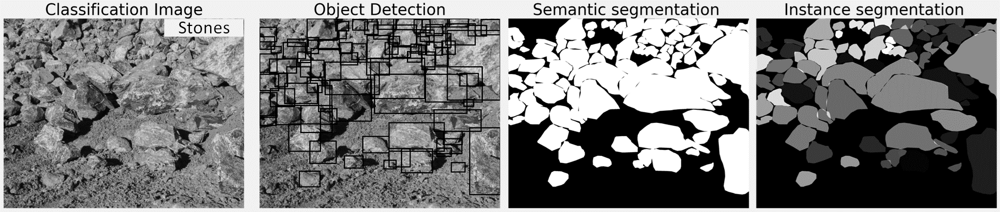

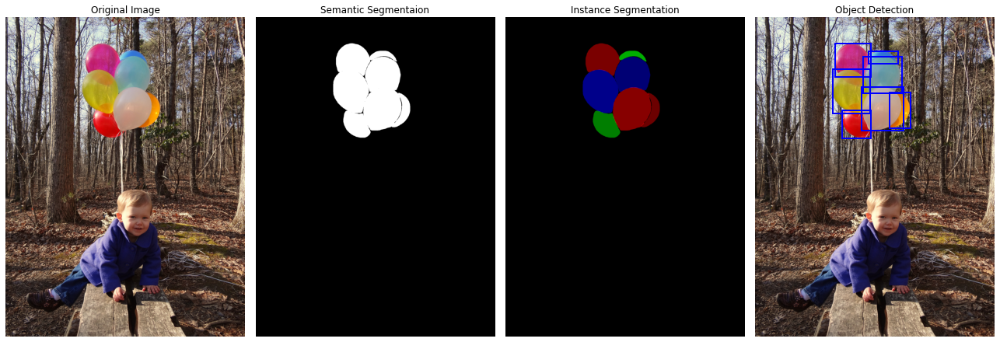

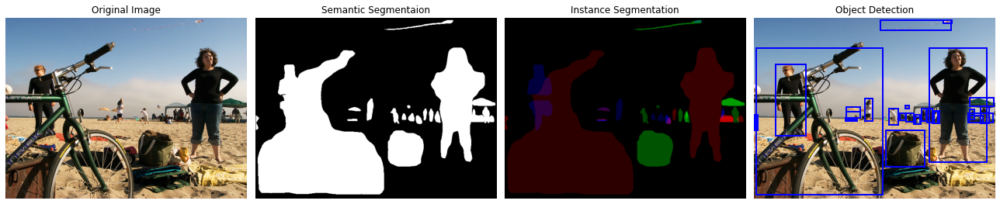

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
<b>Specificity of Object Detection</b><br>
 As a rule the object detection task in the combination of classification and bound-regression tasks, joined together:
    $$ L_{i} = \alpha L_{cls} + (1-\alpha)L_{box},$$
    where:<ul>
    <li> $ L_{cls}$ is the classification or object loss. frequently categorical cross-entropy, $-\log(\hat{y}_i)$;
    <li> $ L_{box}$ is the loss for boundary box position and size regression task (frequently $L_2$ or $Huber$ i.e. $L_1^{smooth}$).
    <li> $\alpha$ is the weight of both those components.
</ul> 
    <blockquote>
          For instance, for faster-rcnn:
                $$
                \begin{align*}
        &\mathcal{L} = \mathcal{L}_\text{cls} + \mathcal{L}_\text{box} =\\\\
        &= \frac{1}{N_\text{cls}} \sum_i \mathcal{L}_\text{cls} (\hat{y}_i, y_i) + \frac{\lambda}{N_\text{box}} \sum_i y_i \cdot L_1^\text{smooth}(t_i - t^*_i) \\
        \end{align*}, $$
                where:<ul>
                <li> $ \mathcal{L}_\text{cls} (\hat{y}_i, y_i) = - y_i \log \hat{y} - (1 - y_i) \log (1 - \hat{y}_i) $
                <li> $L_1^\text{smooth}(x) = \begin{cases}
                        0.5 x^2             & \text{if } \vert x \vert < 1\\
                        \vert x \vert - 0.5 & \text{otherwise}
                    \end{cases}  $  
                <li> <table class="info">
          <tbody>
            <tr>
              <td><strong>Symbol</strong></td>
              <td><strong>Explanation</strong></td>
            </tr>
            <tr>
              <td>\(\hat{y}_i\)</td>
              <td>Predicted probability of anchor i being an object.</td>
            </tr>
            <tr>
              <td>\(y_i\)</td>
              <td>Ground truth label (binary) of whether anchor i is an object.</td>
            </tr>
            <tr>
              <td>\(t_i\)</td>
              <td>Predicted four parameterized coordinates.</td>
            </tr>
            <tr>
              <td>\(t^*_i\)</td>
              <td>Ground truth coordinates.</td>
            </tr>
            <tr>
              <td>\(N_\text{cls}\)</td>
              <td>Normalization term, set to be mini-batch size (~256) in the paper.</td>
            </tr>
            <tr>
              <td>\(N_\text{box}\)</td>
              <td>Normalization term, set to the number of anchor locations (~2400) in the paper.</td>
            </tr>
            <tr>
              <td>\(\lambda\)</td>
              <td>A balancing parameter, set to be ~10 in the paper (so that both \(\mathcal{L}_\text{cls}\) and \(\mathcal{L}_\text{box}\) terms are roughly equally weighted).</td>
            </tr>
          </tbody>
        </table> 
                </ul>
    </blockquote>
If we are taking  instance segmentation, than it is combination of object detection with pixel-wise classification tasks:     <blockquote>   
   For mask-rcnn the loss will have third component:
       $$ \mathcal{L} = \mathcal{L}_\text{cls} + \mathcal{L}_\text{box} + \mathcal{L}_\text{mask}, $$
        where: 
        $$\mathcal{L}_\text{mask} = - \frac{1}{w_{\text{ROI}}\cdot h_{\text{ROI}}} \sum_{1 \leq i, j \leq m} \big[ y_{ij} \log \hat{y}^k_{ij} + (1-y_{ij}) \log (1- \hat{y}^k_{ij}) \big], $$
        and $w_{\text{ROI}}, h_{\text{ROI}}$ are the sizes of bounding box (region of interested for target instance).
        
<!--         https://lilianweng.github.io/lil-log/2017/12/31/object-recognition-for-dummies-part-3.html -->
<!--         https://lilianweng.github.io/lil-log/2018/12/27/object-detection-part-4.html -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Overfeat (2013) </b><br>
    This is one of the first successful attempts of using neural network for object detection problem.<ul>
    To be more precise this network has solved the object localization problem.</ul>
    The main idea of method was to moving window through the image with predicting class and change of size in each position.<ul>
    The window could also change their size, for instance based on the previous prediction.</ul>
    The training was performed in tow stages:<ul>
    <li> feature encoder training for whole images;
    <li> fixed feature encoder with training of regression head.   <ul>
       <li> regression was training only if score for classification higher than threshold (50%).
       <li> regression was trained for different scales of window.
        


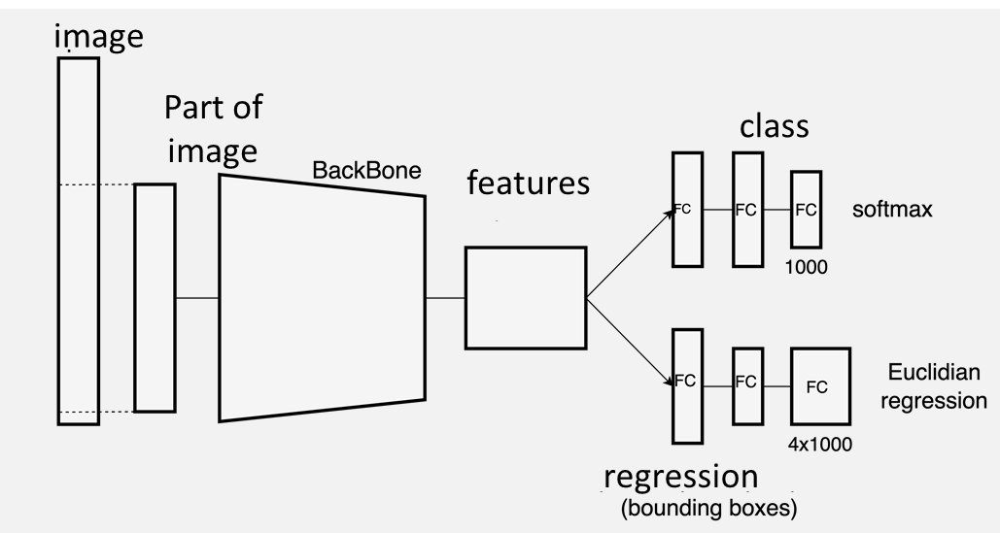

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    The problem of regression in Overfeat is the case if for one object are proposed the several region-candidates.<ul>
    <li> For different regions could be different score of classification - i.e. different value of confidence.
    <li> Different regions could have different intersection and how to determine which region corresponds to each object.
    </ul>
    
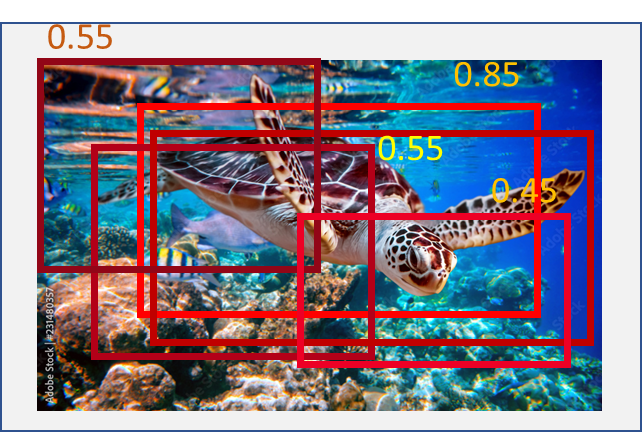

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The problems was solved using <b> Non-Maximum Suppression (NMS)</b> algorithm. <br>
    The algorithm work in the evaluation stage for results of network work<ul>
    The algorithm check and select the best bounding box (BBox) for each object.</ul>
The NMS algorithm:<ul>
    <li> <b>Input</b>: list of bounding boxes and estimated scores; <br>
         Threshold value for score, <br>
         Threshold value for Intersection over Union (IoU).
    <li> <b>Output</b>: list  of boxes for each object.
    <li> <b>Algorithm steps</b><ul>
        <li> selection of BBoxes with score higher then threshold score.
        <li> Calculation of IoU for each pair of BBoxes.
        <li> Grouping of BBoxes with IoU higher then threshold value.    
        <li> Selection of BBoxes with maximum values of scores for each group.
        <li> The routine could repeat iteratively while BBox deletion will continue.    

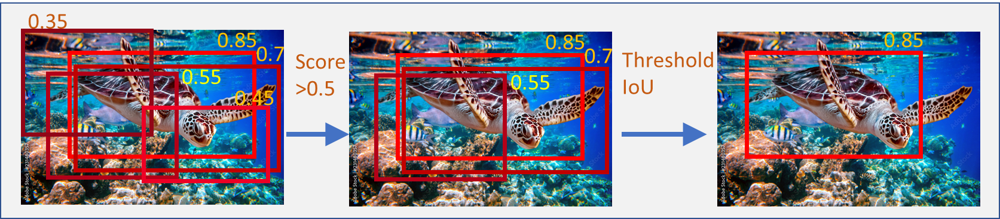

## Multistage approach

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Regions with CNN features, R-CNN </b><br>
    The R-CNN is the next step, after OverFeat.<br>
    This architecture is the first example of real multi-stage object detection networks.<ul>
    The architecture join all the contemporary best practices for 2015 year</ul>
    As the OverFeat the network sliding through the window. But R-CNN trained jointly for classification and regression problems.


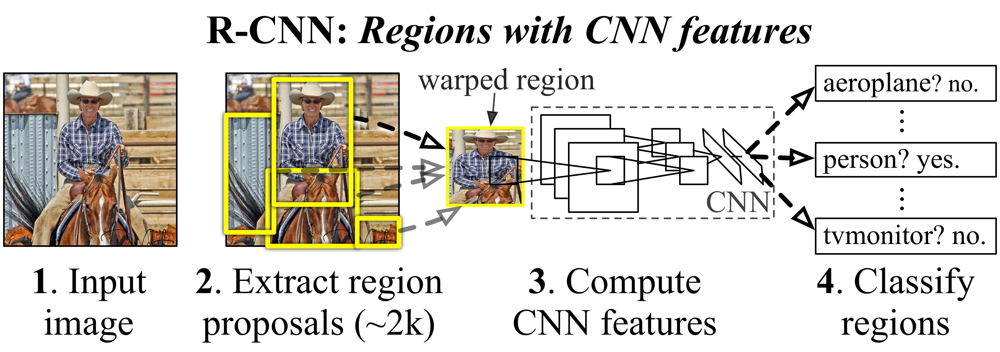

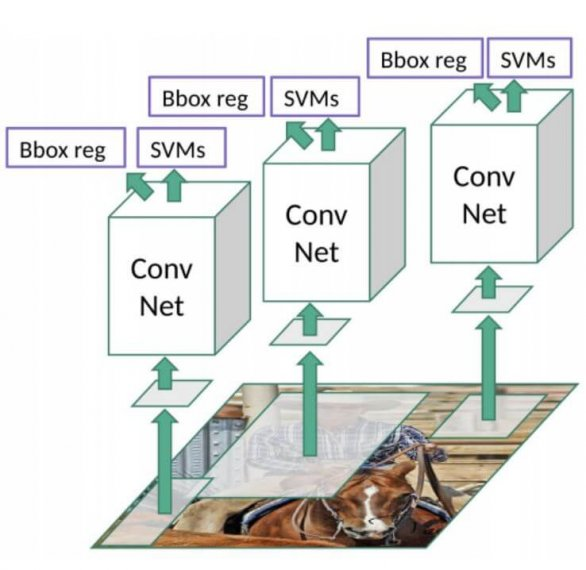

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
R-CNN algorithm works in several stages:<ul>
   <li>  0 Step - preprocessing - selection of candidate regions (regions of interest, RoI). <ul>
       The network select about 2000 regions.<br>
       Authors does not specify the methods, but in their work they apply selective search. <ul>
       The selective search proposed regions by approximation of counters on the objects by so-called Super-pixels </ul></ul>
       This Step is only preliminary stage  which applied before training as way to RoI selection.
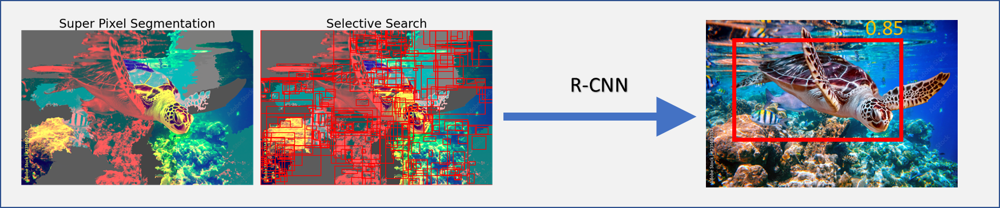

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'><ul>
<li>1 step: feature selection for each RoI. <ul> 
    Backbone based on the Alexnet.</ul>
    Each feature is vector with 4096 values.
<li> 2 step: Classification with SVM (support vector machine).
<li> 3 step: Regression of BBoxes. <ul>
    After this regions are squeezed by NMS.</ul>
    
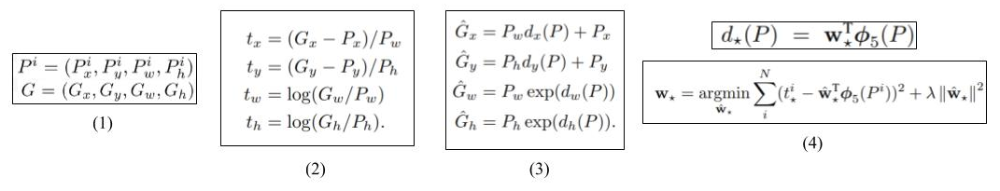
    
Equation 1: The aim of this task is to learn a target transformation between our predicted proposal P and the target proposal G. The variables x, y, w, and h stand for the coordinates of the center (x, y) and the width w and height h of the proposal.
    
Equation 2: The ground-truth transformations that need to be learnt are shown in equation 2. The first two transformations specify a scale-invariant translation of the center of P — x and y, and the second two specify log space transformations of the width w and height h.
    
Equation 3: dₖ(P) where ₖ can belong to (x, y, h or w) is the predicted transformation. Ĝ signifies the corrected predicted box calculated using the original predicted box P and the predicted transformation dₖ(P).
    
Equation 4: The predicted transformation dₖ(P) is modeled as a linear function of the feature extractor. Hence, dₖ(P) = wₖᵀ Φ₅(P) where wₖ is the vector of learnable model parameters. Note that Φ₅ is dependent on the actual image features. wₖ is learnt by optimizing the regularized least-squares objective function shown in the second line of equation 4.
    
Other notes: The algorithm only learns from a predicted box P if it is near at least one groundtruth box. Each predicted box P is mapped to its groundtruth by choosing the groundtruth box with which it has a maximum overlap (provided it has an IoU overlap of at least 0.6). A separate transformation is learnt for each class of the detection task.
The final output of stage 3: For all the positive region proposals of each class predicted from the SVM, we have an accurate, corrected bounding box around the object.
<!-- https://towardsdatascience.com/r-cnn-for-object-detection-a-technical-summary-9e7bfa8a557c -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Spatial Pyramidal Pooling Net</b><br>
   The main idea: is to select regions of different size for each feature map - using of <b> Spatial Pyramidal Pooling (SPP) </b>. <ul>
    This operation could be carried out using max-pooling with required output size (adaptive pooling).  <br>
    This approach allows to take into account different context of each object. </ul>
    The network extract feature from the whole image and than use selective search on the result of SPP.<ul>
    In difference with R-CNN here features extracted only once. </ul>



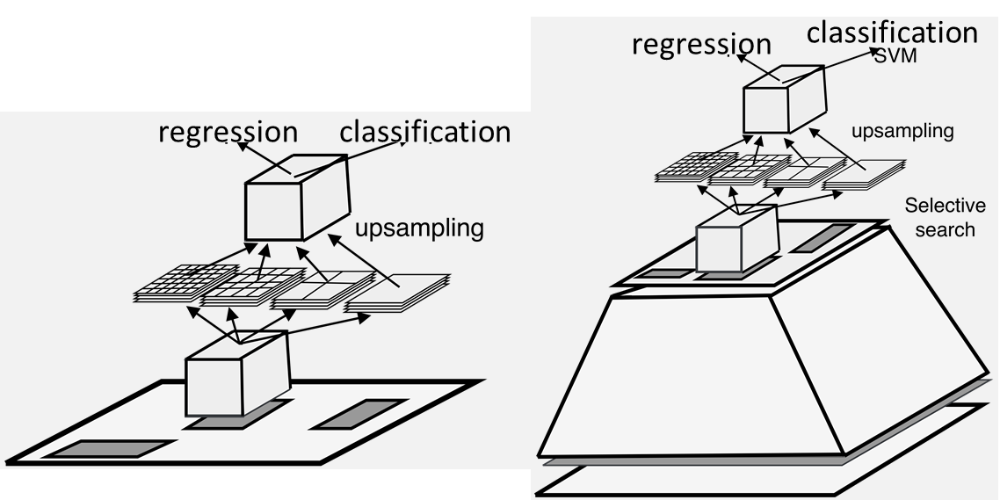

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Fast R-CNN</b><br>
Fast-R-CNN is the modification of the  R-CNN and SPPNet approaches. <br>
The networks still apply selective search, <br>
    But replace SPP with the ROI Pooling for one version of feature maps.<ul>
    The Region Of Interest Pooling (RoI Pooling) is the operation of selection regions and resize them to the same predefined shape. </ul>
    This allow to reduce the computation resources into 20 times in comparison with R-CNN <ul>
    In addition the network use SoftMax instead of SVM.</ul>
  

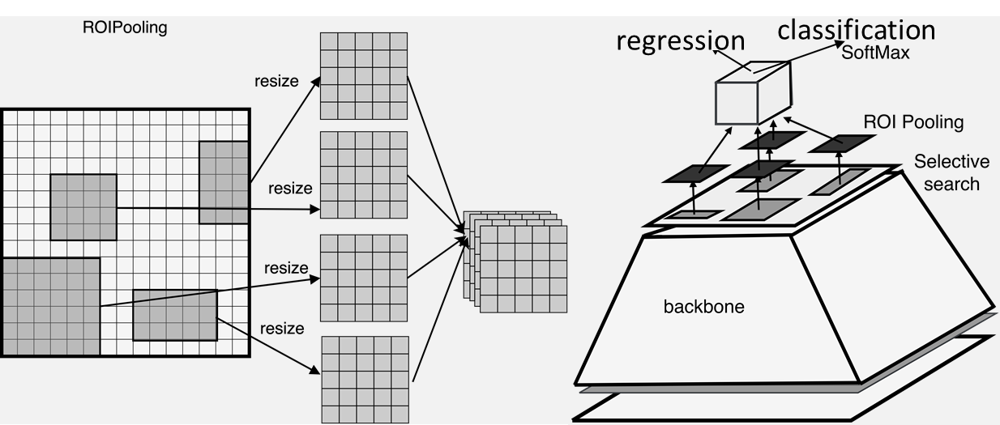

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Faster R-CNN</b><br>
Faster-R-CNN is the modification of the Fast-R-CNN, <br>
The main idea is to replace selective search by small additional shallow network for prediction of regions candidates  <b>(Regeon proposal network, RPN).</b> <ul>
    The results of the RPN are candidate boxes.<br>
    For each candidate ROIPooling and head processing are carried out.    
    </ul>


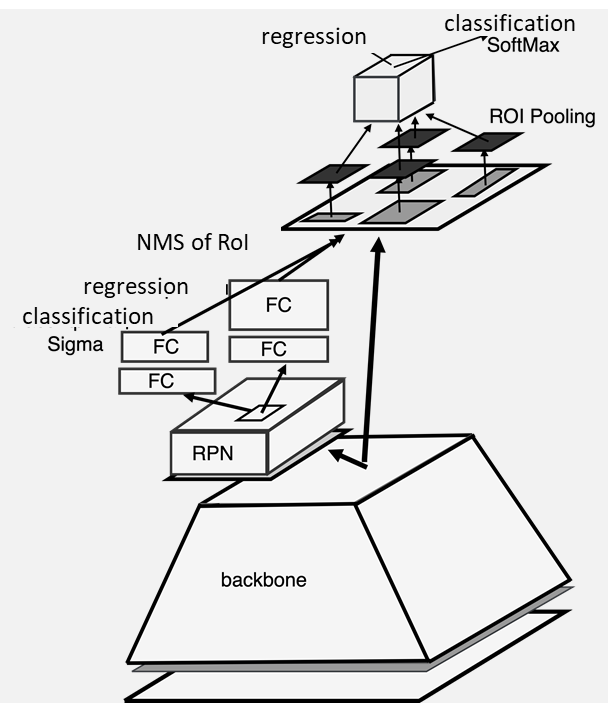

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Faster R-CNN (2015)</b><br>
Theide of Region Proposal Network (RPN) slyding by window with kernel $3×3$ through feature maps, for instance with 256 channels. <br>
    The result for each window is so-called anchor box (region of interest).<ul>
    For each anchor: their box parameters and objectness (binary classification object or not) are determined.
    The center of each anchor is the kernel center <br>
    If score for anchor > threshold, than it positive anchor
    </ul>
    Each position of window can propose several anchors with different scale and aspect ratios.<ul>
    For instance, aspect ratios 1:1, 2:3, 3:2, scales: 1, 2, 3.</ul>
    The overall number of anchors could be reduced using preliminary NMS


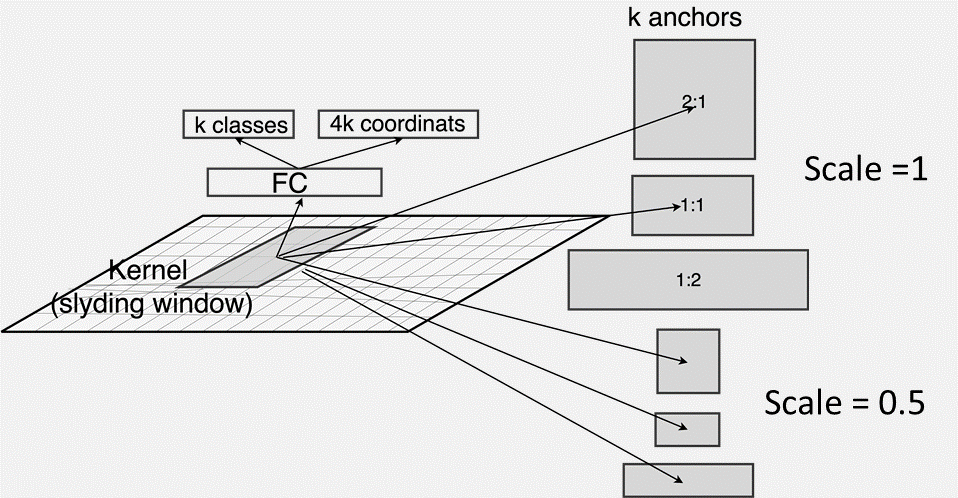

cascade r-cnn


<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRvq9tDJUqCQfNm4E5pIgW46XSk1GSDb07VB9gbxrfzrQ&s">

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Mask R-CNN (2017)</b><br>
The network continue the  Faster-R-CNN and propose to transform the task to instance segmentation.  <ul>
    The task is solving using pixel-wise classification (i.e. semantic segmentation) for each RoI.
    </ul>
    In different with Faster-R-CNN here also proposed to replace ROI Pooling with their resize using bilinear interpolation - RoI Align. <ul>
    This allows to increase the accuracy up to `50%` for small objects.



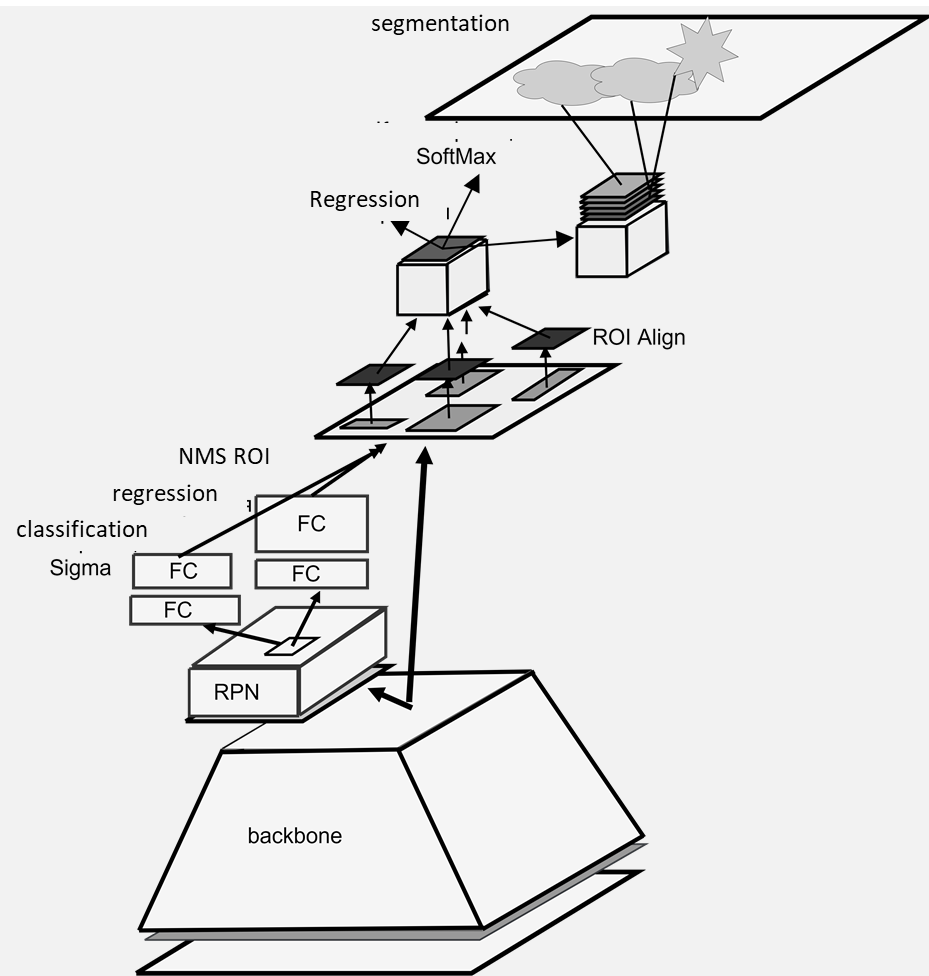

<img src="https://production-media.paperswithcode.com/methods/Screen_Shot_2020-06-14_at_4.13.03_PM.png">

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Feature Pyramidal Network based approach</b><br>
    The main idea is to apply RoI pooling (or align) for different scales of features. <ul>
    The concept under this: with make network deeper we increasing the receptive field but loose information on pooling. <br>
    the pyramid approach allows to keep this information and different context for each object.<br>
    Also this allows to obtain different scales of anchors automatically. <br>
    Approach is applied as for Faster-R-CNN as for Mask-R-CNN


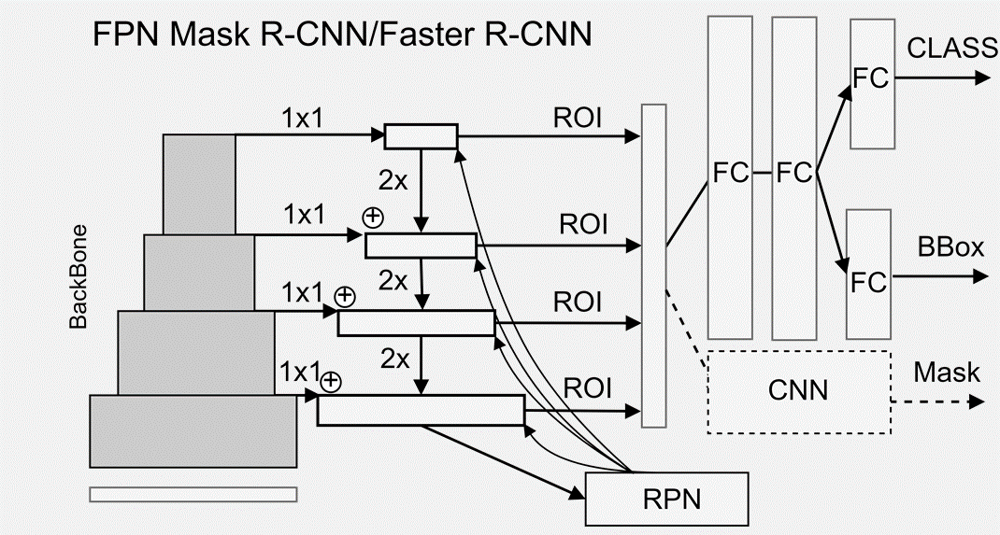

## One-stage object detection

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    Under concept of the one-stage approaches lay principle of dividing of input image into cells (regions), <br>
    Then object is searching in each cell. <ul>
    This means that we considering the hypothesis   that we have object  in the cell, and we want to estimate score and shape for the hypothesis. </ul>
    In the mutli-stage approach we have use intermediate result for which we estimate ROI (and with NMS). <br>
    One-stage approaches are faster, but could provide less accuracy, especially for a lot of small objects.<br>
    However, most of the modern networks are one-stage.
                                                                                                                



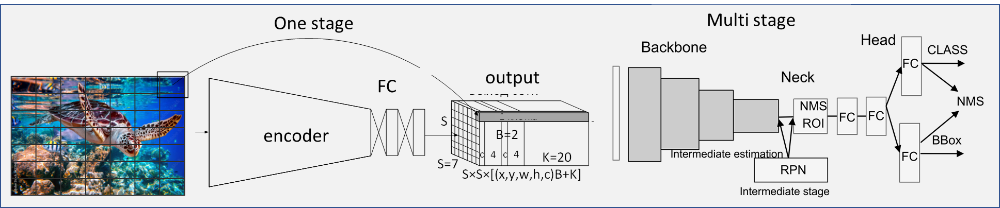

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>YOLO - You Look Only Once</b><br>
The YOLO is first successful attempt of one-stage approaches. <br>
    The network solve the object detection task as the regression problem.  <br>
    The network output is tensor with, for instance: shape $7\times7\times30$ values.
    where <ul> 
        <li> $7x7$ – $49$ cells for which image is divided.
        <li> $30$ are the $(x,y,w,h,c)*B+K$, where <ul>
            <li> $x,y,w,h$ are the coordinates of center of the object and their width and height.
            <li> $с$ is the confidence of object presence (objectness) of bounding boc (bbox);
            <li> $B$ – is the number of Bbox per cell (2 in original),
            <li> $K$ – is the number of classes.
            </ul>
    </ul>
    YOLO aplpy inception-like backbone DarkNet, which almost the same as GoogLeNet (Inception) <ul>
    also exist Fast YOLO reduced framework; VGG-16 Yolo and Resnet-Yolo;
    </ul>
    but with  LeakyReLU,<br>
    and with using  DropOut in full-connected layers.


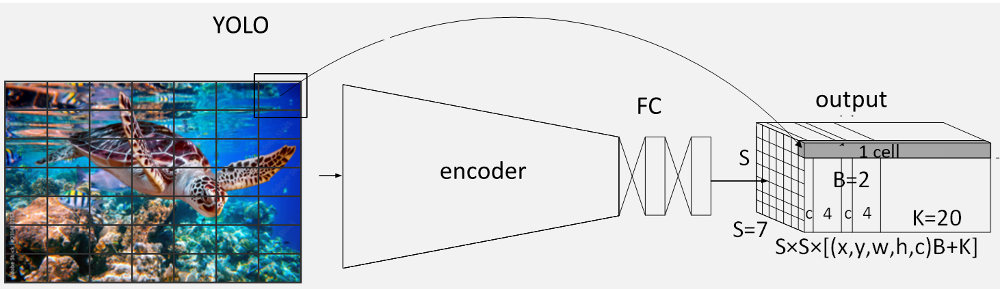


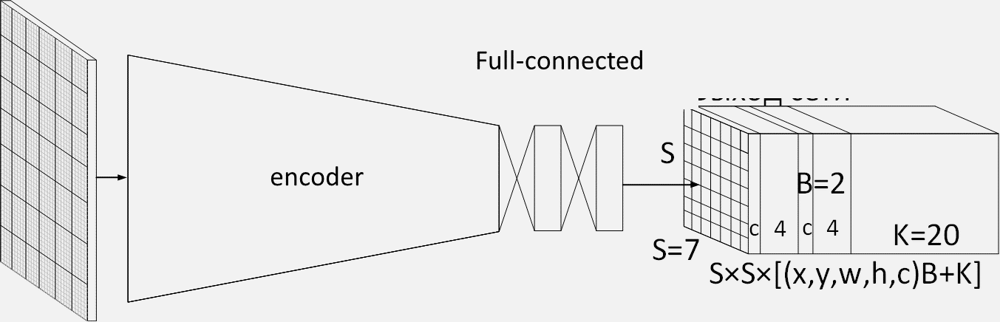

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
Specificity of YOLO labeling

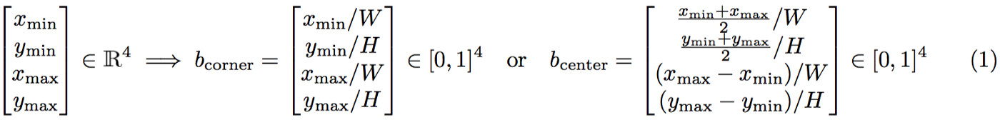

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
So, Yolo divides the image into  $K×𝐾$ cells.<br>
    For each cell or several BBoxes are predicted.<ul>
    For each BBox the objectness in determined.</ul>
    The cell with the object it is the cell where object center with maximum probability.   <br>
    In the original work it could be determined up to $98$ ($7×7×2$) objects with 20 classes.
    The resulted output is determined using NMS (Non Max Suppression). <ul>
    <li> for each class the set  $K×𝐾×B$ ($7×7×2$) is checked, 
    <li> the cells with the confidence less than threshold are excluded.
    <li> the rest cells sorted with their confidence value.
        



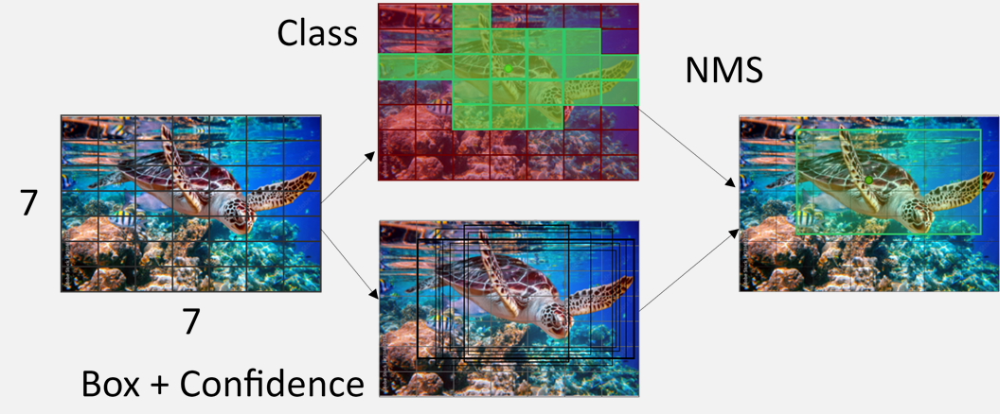

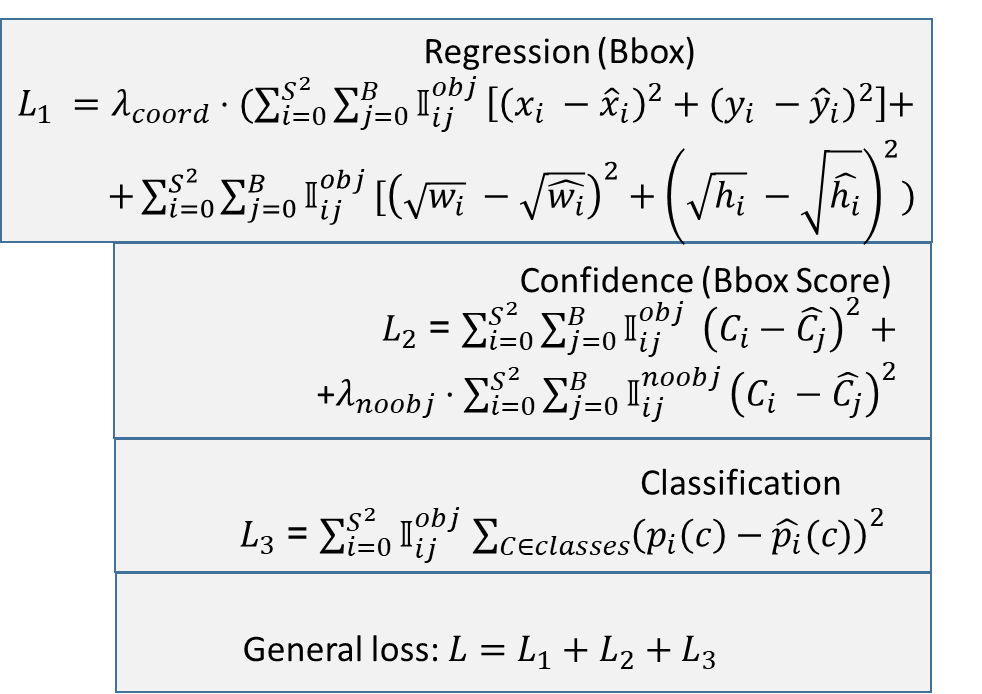

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'> <ul>
    <li>$𝜆_{𝑐𝑜𝑜𝑟}$ и   $𝜆_{𝑛𝑜𝑜𝑏𝑗}$ regularized parameters for balance of loss. <ul>
        In the paper $𝜆_{𝑐𝑜𝑜𝑟}=5$ and   $𝜆_{𝑛𝑜𝑜𝑏𝑗}=0.5$<br>
        The balance assume that most of the BBoxes are empty.</ul>
    <li> $𝐶_𝑖=1$ if cell contains Ground truth  $𝐶_𝑖=0$  if not.
    <li> $𝕀_{𝑖𝑗}^{𝑜𝑏𝑗} =1$ if BBox j contains Ground truth object and 0 if not; $𝕀_{𝑖𝑗}^{𝑛𝑜𝑜𝑏𝑗}$ vise verse;
    <li> $𝑝_𝑖 (𝑐) =1$ if object corresponds to the class $c$ and  0 if not (one-hot encoding);
    <li> Ideally  $𝐶┴^_𝑖$ need to estimate 𝐼𝑜𝑈 for object.
    <li> in the expression $√𝑤,√ℎ$ for reducing difference between small and large objects.


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>SSD - Single Short Detector</b><br>
     The main idea of SSD is to extract features for different scales of feature map (Multi-Scale Detection). <ul>
        It supposed, that than less size of the feature map, than large size of the object that could be extracted.<br>        
        However, it leads to the loss of the semantic information. <br>
        Thus it also need to have large feature map for small objects</ul>
   


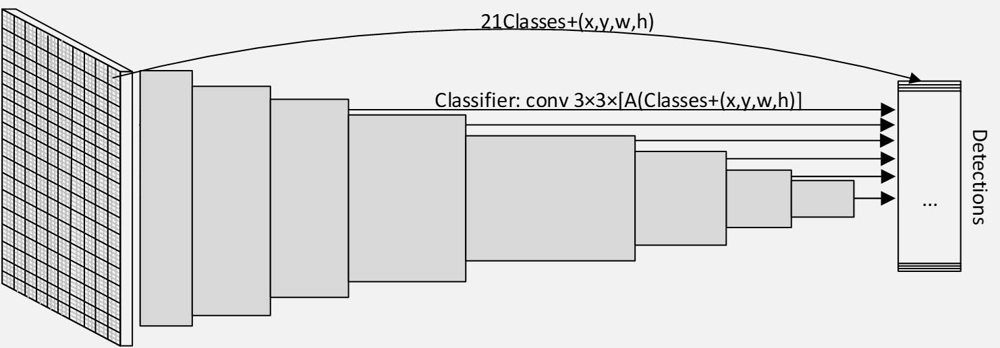

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The features extracted for several feature map scales. <br>
    For feature extraction addition CNN layers applied (like RPN).<br>
    The output contains  large number of anchors (different scales for one cell position) <ul>
    also each scale could produced anchors of different aspect ratio. </ul>
    Each anchor estimate BBox coordinates and classes, including background. <br>
    At all the output contains about 10000 anchors. <ul>
        Most of the regions are empty (negative samples) - thus the task contains larage disbalance. <ul>
            regions with object calls positive samples.  </ul>
    </ul>
    The balance between positive and negative samples obtained by so-called<br>
    <b>Hard Negative Mining</b> <ul>
    This assumes that the loss function calculated for batches with ratio of positive to negative samples $1:3$.<br>
    Among the negative samples are selected the ones where  score maximum.


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>RetinaNet</b><br>
    The Retina is the onestage modification of the FPN network approach. <br>
The network use  FPN backbone and two heads for each scale <ul>
    classification $K$-classes and regression $(x,y,w,h)$, which are generated for several anchors (different aspect ratio).</ul>
    At all network contains about 10 000 -1000 000 anchors, but do not perform NMS


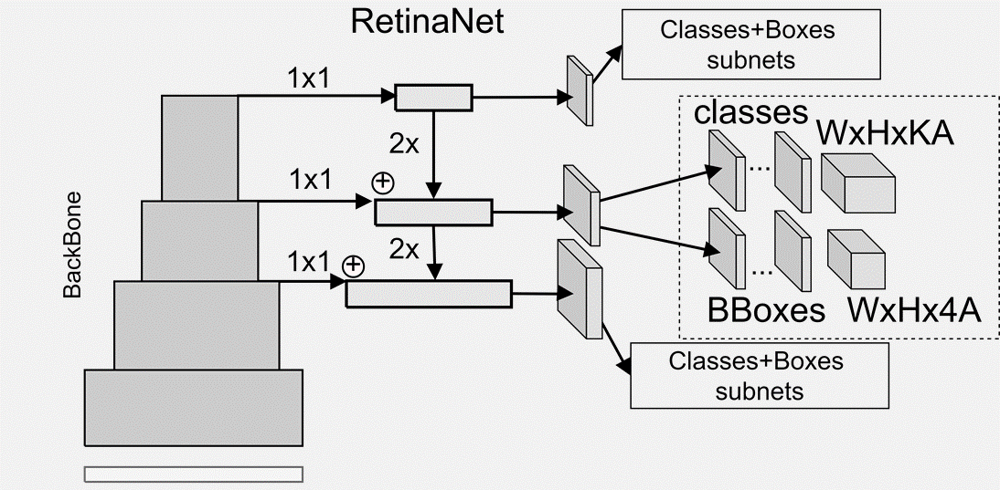

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>    
    Loss of the classification is calculated as Focal loss:<ul>
    IT is assumed to have almost all anchors empty.<br>
    most of the anchors should be easy negatives samples;<ul>
    But it also could exit  hard positive samples which most probably will false classified, especially at the first epochs.</ul>
    The compensation of this phenomena could be:<ul>
    <li> solve imbalance problem by NMS;
    <li> solve by batch collection, like On-line Hard Example Mining (it is almost the same as hard negative mining, but you calculate loss function for samples with some ratio between positive and negative samples);
    <li> solve by using  imbalance loss function.   </ul>
    Authors of RetinaNet proposed to use <b> focal loss</b>:
$$𝐿_{𝑐𝑙𝑠}=𝛼(1−𝑝)^𝛾  \log⁡ 𝑝,$$
    where <ul>
    <li>$p = \hat y$ if $y$ corresponds to the $ \hat y$ and $p = 1-\hat y$ in other case; 
    <li> in the paper $𝛾=2;𝛼=0.2$, $𝛼$ need to be than greater, than large number of hard examples. 
    <li> The general loss function $𝐿 =𝜆 𝐿_{𝑙𝑜𝑐}  + 𝐿_{𝑐𝑙𝑠}$ 
    <li> $𝐿_{𝑙𝑜𝑐}$ - modified Huber Loss (L1-soft loss). 
    <li> When we are training network we considering positive samples that have $𝐼𝑜𝑈≥0.5$, negative (background) if $𝐼𝑜𝑈<0.4$ other excluded.
    <li>  $𝐿_{𝑐𝑙𝑠}>0$ only for positive samples.
    
    

   

## Fast architectures for object detection

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Yolo V2</b><br>
    Full connected layers of v1 replaces with RPN. <br>
    Each anchor contains as confidence score as class scores. <br>
    Before output merge features for two scales using pass-through connection (resize feature map).<ul>
    Reshapes $26 × 26 × 512→ 13 × 13 × 2048$ and conv $1×1$ after</ul>
    Input image size $416 х 416$ <ul>
    During the training size of images could change scale - multiscale augmentation.</ul>
    Output increased from $7\times7$ to $13\times13$.<ul>
    This is only requirement to have input size as multiplyer of 13.<br>
    Due to add number of cells, center of the object is the left corner of the cell instead of it center.
    


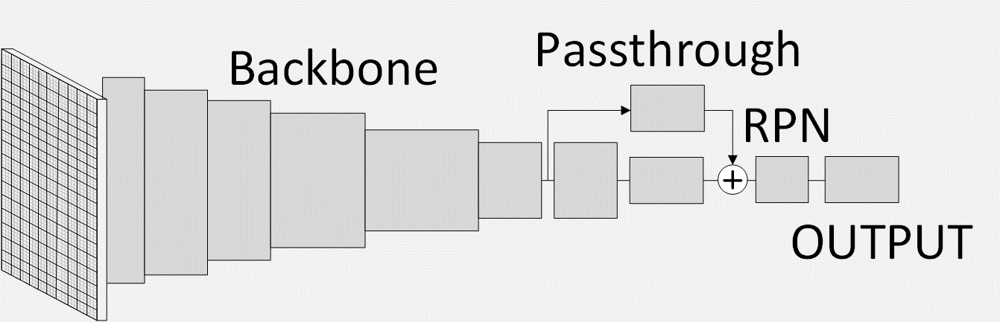

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    The Yolo V2 apply RPN approach using Conv Layer. <br>
    The output is 5 anchors for each cell.<ul>
    the aspect ratios for original training was determined by  a prior analysis (clustering) of  the dataset.<br>
    Each anchor contains batch predictions, objectness and all classes <ul>
    output shape $ ((4+1+K)\cdot A) \times 13\times 13 $ </ul>
 

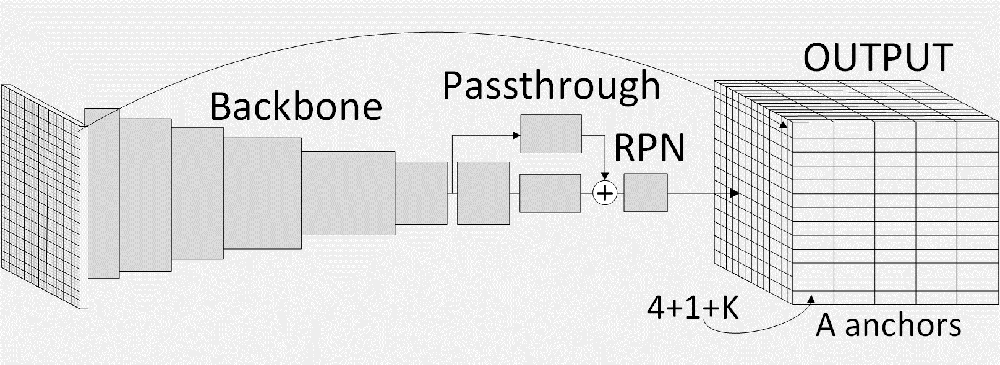

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Yolo V3</b><br>
    Backbone with FPN neck.<ul>
    Predictions with 3 scales: for small, medium and large objects </ul>
    The network apply up-sampling for producing different scales. <br>
    Each scale produce several anchors with different aspect ratio.
    The task solved as  Multi Label classification (several Sigmoids) <ul>
    The idea here that classes could crossing (young and baby), thus authors assumes that we could increase the accuracy taken both results.</ul>


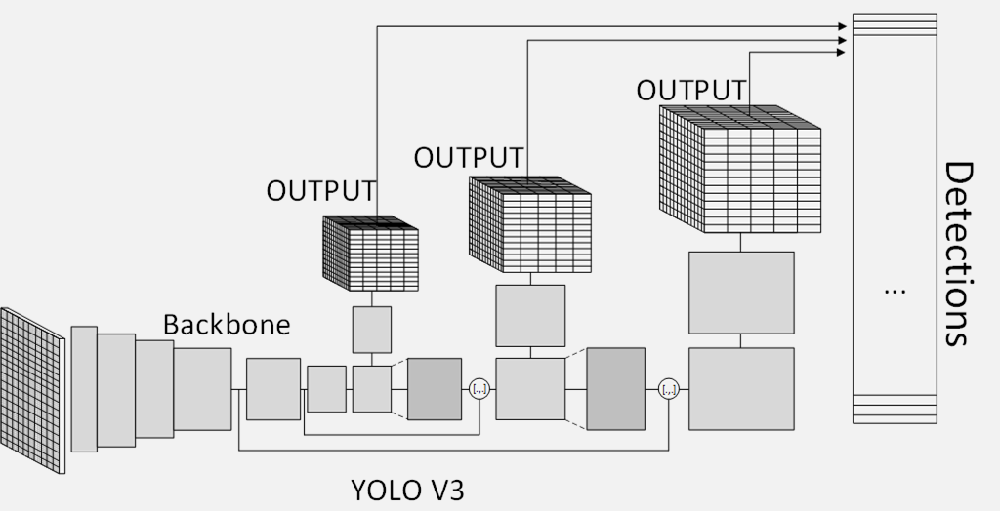

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Yolo V4, YOLO4 scaled</b><br>
    YOLO 4, YOLO4 scaled  are modified backbone for Yolo V3. <br>
    The nack replaced with  Path Agregattion Network (PAN) approach. <br>
The ReLU changed to  Mish activation function. <br>
    Authors proposed a lot of augmentation tricks; 

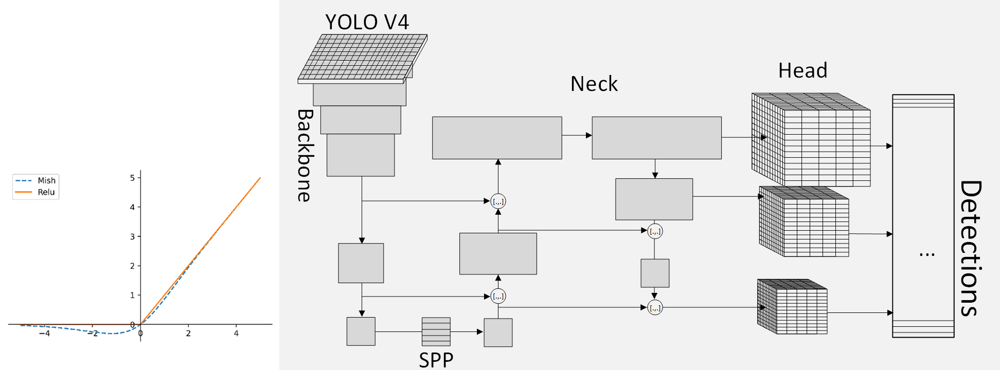

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Yolo V5</b><br>
    Yolo V5 is the modification of Yolo V4, rewriten in PyTorch and with several variants ( nano to large). <br>
    activation function mish replaced with  LeakyReLU, Sigmoid <br>
     the recommendation for augmentation updated: scaling, color space adjustments, and mosaic augmentation; <br>
     Provided results for focal-loss and classical approach.<br>
    The aspects ratio could be obtained automatically for each dataset. 


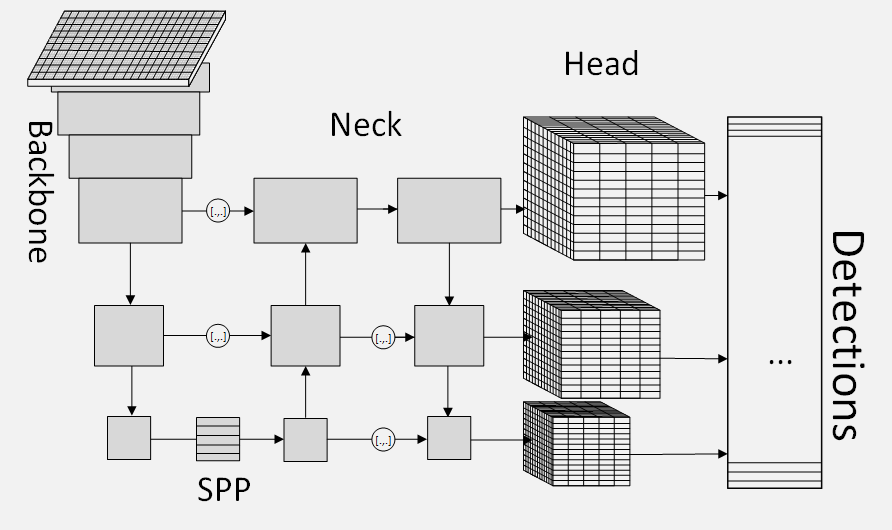

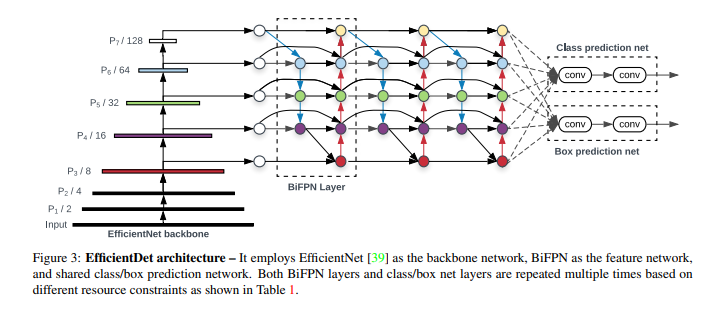

https://docs.ultralytics.com/models/yolo-world/